## Beep maker
### exercise 3: DATA DRIVEN SEQUENCES

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from importlib import reload

# from the y21 notebook-- do we need these?
from subprocess import Popen
import subprocess as sp
import os

import pandas as pd

import IPython.display as ipd

from funcs import bips as bip
from funcs import notepicker



['BA_ben_1.pkl', '.DS_Store', 'y2020-02-13_tsawi0_37s.pkl', 'y2020-02-13_anna1_37s.pkl', 'y2020-02-13_chris0_37s.pkl']
      hum  temp_C  time_s
0  28.922   25.13  0.0000
1  28.854   25.12  0.3852
2  28.786   25.12  0.7701
3  28.686   25.14  1.1554
4  28.626   25.24  1.5403


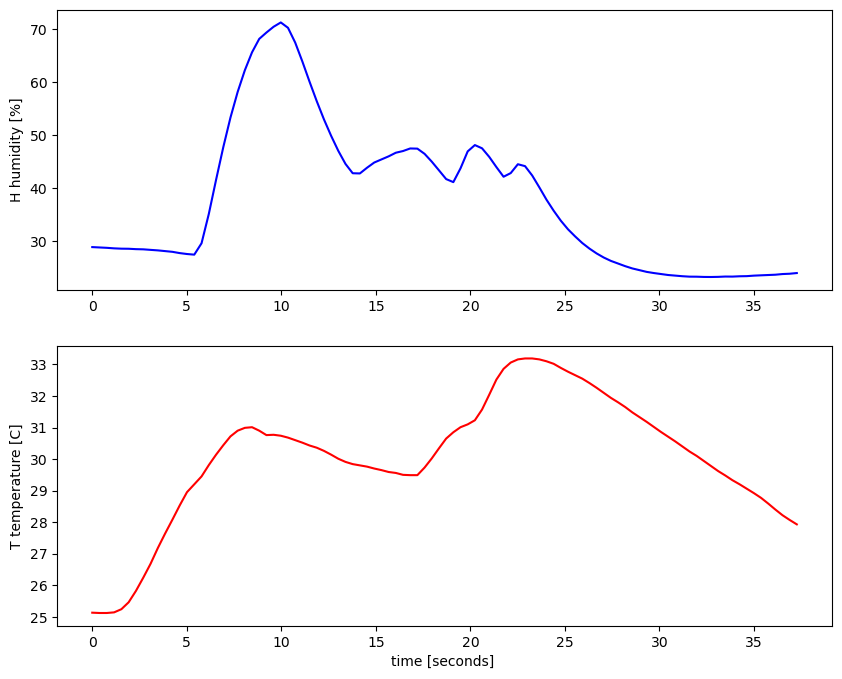

In [57]:
# READ IN THE DATA FILE 
print(os.listdir(os.path.abspath('./data/breathalyzer/')))

#datafilename = './data/breathalyzer/BA_ben_1.pkl'  
datafilename = './data/breathalyzer/y2020-02-13_anna1_37s.pkl'      

breath = pd.read_pickle(datafilename) # np.loadtxt(datafilename)
print(breath[0:5])
time = breath.time_s
p1 = temp_C = breath.temp_C
p2 = humidity = breath.hum

# put the data into a dictionary: 
# (very useful, but we will also work with pandas)
data_dict = {}
data_dict['time_o'] = time  # the _o indicates these are the original values, un-re-sampled
data_dict['p1_o'] = p1

# PLOT THE DATA AS CURVES... 
fig = plt.figure(figsize=(10,8))

plt.subplot(2,1,1)
plt.plot(time,humidity,'b-')
#plt.xlabel('time')
plt.ylabel('H humidity [%]')

plt.subplot(2,1,2)
plt.plot(time,temp_C,'r-')
plt.xlabel('time [seconds] ')
plt.ylabel('T temperature [C]')

plt.show()

#  First method: Time determines pitches
(1) Decide the times at which you want to sample the data <br>
(2) Interpolate the y-values to a range of frequency <br>
(3) Interpolate the frequency values at each time <br>
(4) Convert to beeps..

In [58]:
# (1) Decide the times at which you want to sample the data
ind_end = len(time)-1
duration_data = time[ind_end]
print('data duration = ', str(duration_data))
t_start = 0
t_end = time[ind_end] 
n_notes = 40
times = np.linspace(t_start,t_end,n_notes)

# stretch or shrink time, for the duration of the score-- 
# but you'll see why we need to keep the original times... 

stretch = 0.5
times_sco = times*stretch
dur_sound = str(times_sco[-1])
print('score duration = ', str(dur_sound))
dt = times_sco[2]-times_sco[1]
print(dt)

data duration =  37.2653
score duration =  18.63265
0.47776025641025643


In [59]:
# (2) Interpolate the y-values to a range of frequency 
# NOTE: we will use interpolate all the time ! play with it to understand what it is doing! 
p1_data_range = np.linspace(min(p1),max(p1),40) # the number of points doesnt matter here ! 
f_min = 220.
f_max = 800.
freq_range = np.linspace(f_min,f_max,40)

# np.interp(x, xp, yp) : 
# x is the array of discrete sampling values, xp is original x, yp is original y
# returns the y values at 

p1_f = np.interp(p1,p1_data_range,freq_range)
# print(p1[0:10])
# print(p1_f[0:10])

# (3) Interpolate the frequency values at each time
pitches = np.interp(times,time,p1_f)
print(pitches[0:10])

[220.71871128 220.69174053 243.85453434 314.308753   398.34219567
 477.04207549 528.98510375 588.63755969 633.80785444 640.2416916 ]


Text(0, 0.5, 'frequencies (T temperature)')

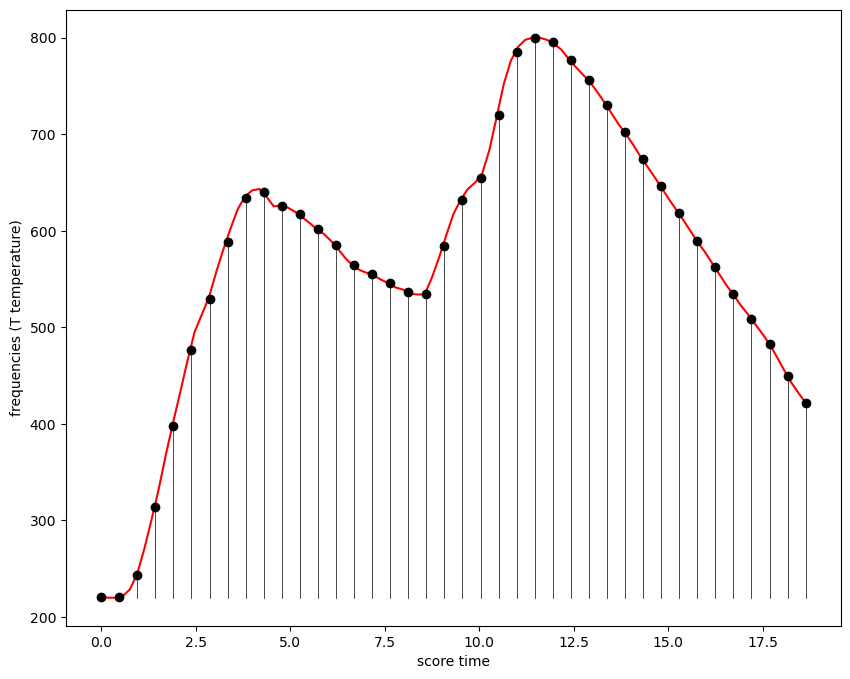

In [60]:
# plot the results: 

fig = plt.figure(figsize=(10,8))
time_tmp = np.linspace(times_sco[0],times_sco[-1],len(p1_f))
plt.plot(time_tmp,p1_f,'r-')
plt.plot(times_sco,pitches,'ko')
for ind,t in enumerate(times_sco):
    plt.plot([t,t],[f_min,pitches[ind]],'k-', linewidth=0.5)
    
plt.xlabel('score time')
plt.ylabel('frequencies (T temperature)')

## Now we create a sequence of beeps:

In [ ]:
# ==============================
# make an arpeggio of beeps at these frequencies
reload(bip)
bipdur = 0.2  # seconds
track_dur = times_sco[-1] + bipdur
track_time = np.linspace(0, track_dur, int(44100*track_dur))
track = np.zeros(len(track_time)) # initialize silent track

b = bip.Beep()
env = bip.make_3pt_envelope(int(bipdur * b.fs), 0.5)
start_inds = (times_sco * b.fs).astype(int)

for f,si in zip(pitches, start_inds):
    b.make_bip_1f(bipdur, f, env) # returns normalized waveform
    wf = b.wf 
    track[si:si+len(wf)] = wf[:]

ipd.Audio(track, rate=b.fs)

/var/folders/1p/jdcprp414tsg3dl650mtvk780000gn/T/ipykernel_73153/535258531.py:16: ComplexWarning: Casting complex values to real discards the imaginary part
  track[si:si+len(wf)] = wf[:]


### Things to add meaning: 
chords <br>
chords that depend on amplitude <br>
weighting that depends on amplitude <br>
rhythm (e.g. a click every fourth beat?) (or a cluck every 4th beet?) <br>

# Second method: Pitches determine time !  

(1) Define the frequencies that we want to use ! <br>
(2) Interpolate the y values to this range of frequencies. <br>
(3) Find where in time these values occur, use these as our start times and durations.  <br>
(4) Generate the track <br>

In [63]:
n_octaves_total = 3.0
root_note  = 110.0
ints_per_oct = 12

# chromatic scale of n octaves: 
intervals = np.linspace(0,n_octaves_total,int(n_octaves_total*ints_per_oct))
pitches = root_note*(2**intervals)
print(pitches)
# OR use the octatonic ! 

[110.         116.73343257 123.8790389  131.4620494  139.50923889
 148.04902119 157.11154938 166.72882232 176.93479761 187.7655115
 199.25920614 211.45646457 224.40035407 238.13657818 252.7136381
 268.18300392 284.5992964  302.02047977 320.50806645 340.1273342
 360.94755664 383.04224785 406.48942191 431.37186837 457.77744462
 485.79938602 515.53663517 547.09419125 580.58348074 616.12275089
 653.83748722 693.86085658 736.33417739 781.40741857 829.23972911
 880.        ]


Text(0, 0.5, 'frequency [Hz]')

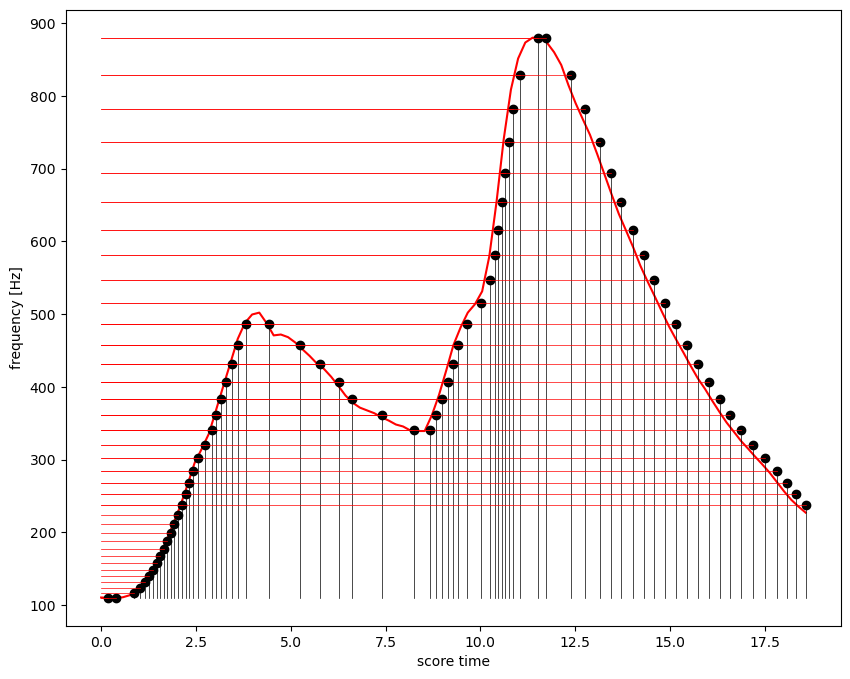

In [64]:
# (2) Interpolate the y-values to a range of frequency (using notepicker !)
reload(notepicker)
data_in_freq = notepicker.interpvals_to_freqs(p1,pitches)

# (3) Find where in time these values occur, use these as our start times and durations.
track_dur = track_dur
times = np.linspace(0,track_dur,len(data_in_freq))
scale_note_dur = 0.75
times, notes, durs = notepicker.findroots(times,data_in_freq,pitches)


# plot the results: 
fig = plt.figure(figsize=(10,8))

time_tmp = np.linspace(0,times[-1],len(data_in_freq))
plt.plot(time_tmp,data_in_freq,'r-')
plt.plot(times,notes,'ko')

for ind,t in enumerate(times):
    plt.plot([t,t],[min(notes),notes[ind]],'k-',linewidth=0.5)
    plt.plot([0,t],[notes[ind],notes[ind]],'r-',linewidth=0.5)
    
plt.xlabel('score time')
plt.ylabel('frequency [Hz]') 

In [ ]:
# ==============================
# make an arpeggio of beeps at these frequencies
reload(bip)
bipdur = 0.1  # seconds
track_dur = times[-1] + bipdur
track_time = np.linspace(0, track_dur, int(44100*track_dur))
track = np.zeros(len(track_time)) # initialize silent track

b = bip.Beep()
env = bip.make_3pt_envelope(int(bipdur * b.fs), 0.5)
start_inds = (times * b.fs).astype(int)

for f,si in zip(data_in_freq, start_inds):
    b.make_bip_1f(bipdur, f, env) # returns normalized waveform
    wf = b.wf 
    track[si:si+len(wf)] = wf[:]

ipd.Audio(track, rate=b.fs)

/var/folders/1p/jdcprp414tsg3dl650mtvk780000gn/T/ipykernel_73153/1163411000.py:16: ComplexWarning: Casting complex values to real discards the imaginary part
  track[si:si+len(wf)] = wf[:]


# ==================================================
# STUFF FROM PREVIOUS NOTEBOOK: 

##  Pitches, scales, elements, frequencies, etc... 
### (1) Frequencies and tonal relationships
### (2) Visualizing tonal relationships 
### (3) Pitch wheels
### (4) Modes -- Dictionaries and lists

------------------------------------------
In mb01, we made simple tones and chords from sine wave oscillators. <br>
Here, we will start with a little bit of music theory, <br>
using loops to make sequences of tones of different pitch (scales! arpeggios!) <br>
This notebook provides background for data-driven sonification in the next notebook. <br>

This notebook also sneaks in some intro to essential python elements: dictionaries, functions and loops. 

Difference between Overtones and Harmonics:  <br>
From Wikipedia: (https://en.wikipedia.org/wiki/Overtone) <br>
An overtone is any frequency greater than the fundamental frequency of a sound. Using the model of Fourier analysis, the fundamental and the overtones together are called partials. Harmonics, or more precisely, harmonic partials, are partials whose frequencies are numerical integer multiples of the fundamental (including the fundamental, which is 1 times itself). <br>

Refs: <br>
Hermann Helmholtz "On the Sensations of Tone" 1863 !! <br>
Gareth Loy "Musimathics, vol. 1" 2006<br>

In [2]:
# Octaves
root = 220.0 # "A3"

# An octave is the first harmonic, a multiple of 2.  
# octaves, by multiplication of integers (powers of 2, i.e. THE MODES OF A VIBRATING STRING!): 
octs = np.array([1,2,4,8]) # four octaves
freqs = root*octs
print(freqs)

#same octaves, by integer exponents of base 2. 
octs_exp = np.array([0,1,2,3])
freqs = root*2**octs_exp
print(freqs)

[ 220.  440.  880. 1760.]
[ 220.  440.  880. 1760.]


In [ ]:
# make a chord of these four tones
reload(bip)
b = bip.Beep()
dur = 2.0 # seconds
envmat = np.zeros((len(freqs),int(dur*b.fs))) # simple env: ones
env = bip.make_3pt_envelope(int(dur * b.fs), 0.2)
for i in range(len(freqs)):
    envmat[i,:] = env

b.make_bip(dur, freqs, envmat)
wf = b.wf/(np.max(np.abs(b.wf))) # normalize
# taper the waveform: 
wf = bip.taper_waveform(wf, alpha=0.05)

ipd.Audio(wf, rate=b.fs)

In [ ]:
# make an arpeggio of beeps at these frequencies
reload(bip)
dur = 0.9  # seconds
track = np.array([])
b = bip.Beep()
env = bip.make_3pt_envelope(int(dur * b.fs), 0.5)

for f in freqs:
    b.make_bip_1f(dur, f, env) # returns normalized waveform
    wf = b.wf 
    track = np.concatenate((track, wf))

ipd.Audio(track, rate=b.fs)

### "Equal temperament" (modern western instruments): 
On the piano, the octave is divided into 12 "semi-tone" intervals: <br>
$f = f_0*2^{v+k/12}$ <br>
$v$ is an integer that marks how many octaves you are above $f_0$ <br>
$k$ are integers that give you the number of intervals of the 12 that make the octave. <br>
<br>
For more on the origin of this, I recommend <br>
"Why you hear what you hear" by Eric Heller <br>

[ 0  1  2  3  4  5  6  7  8  9 10 11]
[ 0  1  2  3  4  5  6  7  8  9 10 11]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12]
all semi-tones:
[220.         233.08188076 246.94165063 261.6255653  277.18263098
 293.66476792 311.12698372 329.62755691 349.22823143 369.99442271
 391.99543598 415.30469758 440.        ]

Intervals of the Major scale:
[2, 2, 1, 2, 2, 2, 1]

Elements of the Major scale:
[ 0.  2.  4.  5.  7.  9. 11. 12.]
[ 0.  2.  4.  5.  7.  9. 11. 12.]

Frequencies of the major scale, with root of 220 Hz:
[220.         246.94165063 277.18263098 293.66476792 329.62755691
 369.99442271 415.30469758 440.        ]


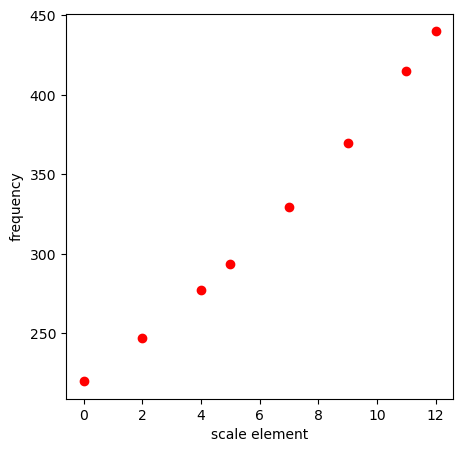

In [ ]:
# make an array of integers: 
k = np.arange(0,12,1) # this makes a numpy array. 
print(k)
k = np.arange(12)
print(k)
k = np.arange(12+1)
print(k)

# ==============================
v = 0
root = 220
print('all semi-tones:')
f = root*2**(v+k/12)
print(f)

# ==============================
print('')
print('Intervals of the Major scale:')
intervals = [2,2,1,2,2,2,1]
print(intervals)
print('')
print('Elements of the Major scale:')
major_indxs = np.zeros(len(intervals)+1)
for i in range(1,len(major_indxs)):
    major_indxs[i] = major_indxs[i-1] + intervals[i-1]
print(major_indxs)

major_indxs = np.zeros(len(intervals)+1)
major_indxs[1:] = np.cumsum(intervals)
print(major_indxs)

# major = np.array([0,2,4,5,7,9,11,12])
# print(major)

# ==============================
print('')
print(f'Frequencies of the major scale, with root of {root} Hz:')
freqs = root*2**(v+major_indxs/12)
print(freqs)

# ==============================
fig = plt.figure(figsize=(5,5))
plt.plot(major_indxs,freqs, 'ro')
plt.xlabel('scale element')
plt.ylabel('frequency')
plt.show()

# ==============================
# make an arpeggio of beeps at these frequencies
reload(bip)
dur = 0.9  # seconds
track = np.array([])
b = bip.Beep()
env = bip.make_3pt_envelope(int(dur * b.fs), 0.5)

for f in freqs:
    b.make_bip_1f(dur, f, env) # returns normalized waveform
    wf = b.wf 
    track = np.concatenate((track, wf))

ipd.Audio(track, rate=b.fs)

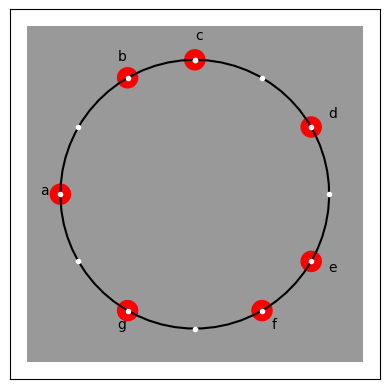

In [ ]:
# show the pitch ring: 
reload(bip)
b = bip.Beep()
bip.makePitchRing(major_indxs[0:-1])

# Make a database of pitches and names: 

In [47]:
pitch_classes = ['c','c#','d','d#','e','f','f#','g','g#','a','a#','b']

A4 = 440.0
C3 = A4 * 2**(3/12-1)
print(f'A4 = {A4}, C3={C3} Hz')

def notenum2freq(k,v,f0):
    freqs = f0*2**(v+k/12)
    return freqs

ints = np.arange(12)
print(ints)
ref_scale_freqs = notenum2freq(ints,0,C3)
print(ref_scale_freqs)

for pair in zip(pitch_classes,ref_scale_freqs):
    print(pair)

# Make a dictionary ! 
pitch_freq_ref = dict(zip(pitch_classes,ref_scale_freqs))
print('')
print(f'F3 = {pitch_freq_ref['f']:.2f} Hz')


A4 = 440.0, C3=261.6255653005986 Hz
[ 0  1  2  3  4  5  6  7  8  9 10 11]
[261.6255653  277.18263098 293.66476792 311.12698372 329.62755691
 349.22823143 369.99442271 391.99543598 415.30469758 440.
 466.16376152 493.88330126]
('c', 261.6255653005986)
('c#', 277.1826309768721)
('d', 293.6647679174076)
('d#', 311.12698372208087)
('e', 329.6275569128699)
('f', 349.2282314330039)
('f#', 369.9944227116344)
('g', 391.99543598174927)
('g#', 415.30469757994507)
('a', 439.99999999999994)
('a#', 466.16376151808987)
('b', 493.88330125612407)

F3 = 349.23 Hz


# The Modes!
The intervals of the "modes": <br>
    'ionian' = [2,2,1,2,2,2,1] <br>
    'dorian' = [2,1,2,2,2,1,2] <br>
    'phrygian' = [1,2,2,2,1,2,2] <br>
    'lydian' = [2,2,2,1,2,2,1] <br>
    'mixolydian' = [2,2,1,2,2,1,2] <br>
    'aeolian' = [2,1,2,2,1,2,2] <br>
    'lochrian' = [1,2,2,1,2,2,2] <br>


In [40]:
# NOW LETS MAKE DICTIONARIES FOR THE MODES !! 

modes = {
    'ionian':[2,2,1,2,2,2,1],
    'dorian':[2,1,2,2,2,1,2],
    'phrygian':[1,2,2,2,1,2,2],
    'lydian':[2,2,2,1,2,2,1],
    'mixolydian':[2,2,1,2,2,1,2],
    'aeolian':[2,1,2,2,1,2,2],
    'lochrian':[1,2,2,1,2,2,2]
}

print(len(modes))

7


[2, 1, 2, 2, 2, 1, 2]


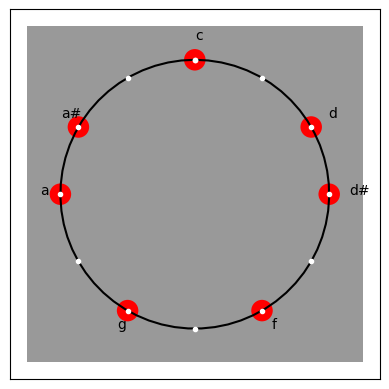

In [ ]:
intervals = modes['dorian']
print(intervals)
indxs = np.zeros(len(intervals)+1)
indxs[1:] = np.cumsum(intervals)
# show the pitch ring: 
reload(bip)
b = bip.Beep()
bip.makePitchRing(indxs[0:-1])


In [ ]:


print(indxs)
print(indxs[-1::-1])
indxs_ud = np.append(indxs, indxs[-1::-1])
print(indxs_ud)

f0 = C3
freqs_ud = notenum2freq(indxs_ud, 0, f0)
print(freqs_ud)

# ==============================
# make an arpeggio of beeps at these frequencies
reload(bip)
dur = 0.9  # seconds
track = np.array([])
b = bip.Beep()
env = bip.make_3pt_envelope(int(dur * b.fs), 0.5)

for f in freqs_ud:
    b.make_bip_1f(dur, f, env) # returns normalized waveform
    wf = b.wf 
    track = np.concatenate((track, wf))

ipd.Audio(track, rate=b.fs)


[ 0.  2.  3.  5.  7.  9. 10. 12.]
[12. 10.  9.  7.  5.  3.  2.  0.]
[ 0.  2.  3.  5.  7.  9. 10. 12. 12. 10.  9.  7.  5.  3.  2.  0.]
[261.6255653  293.66476792 311.12698372 349.22823143 391.99543598
 440.         466.16376152 523.2511306  523.2511306  466.16376152
 440.         391.99543598 349.22823143 311.12698372 293.66476792
 261.6255653 ]


# =========================================================
## TO INCORPORATE FROM mb01 

<class 'numpy.ndarray'>
(44100,)


/Users/ben/githole/datamovies_ppy26/funcs/bips.py:26: ComplexWarning: Casting complex values to real discards the imaginary part
  self.oscmat[ifrx,:] = np.exp(1j*2*np.pi*f*self.t_vec) * self.env_amps[ifrx,:]


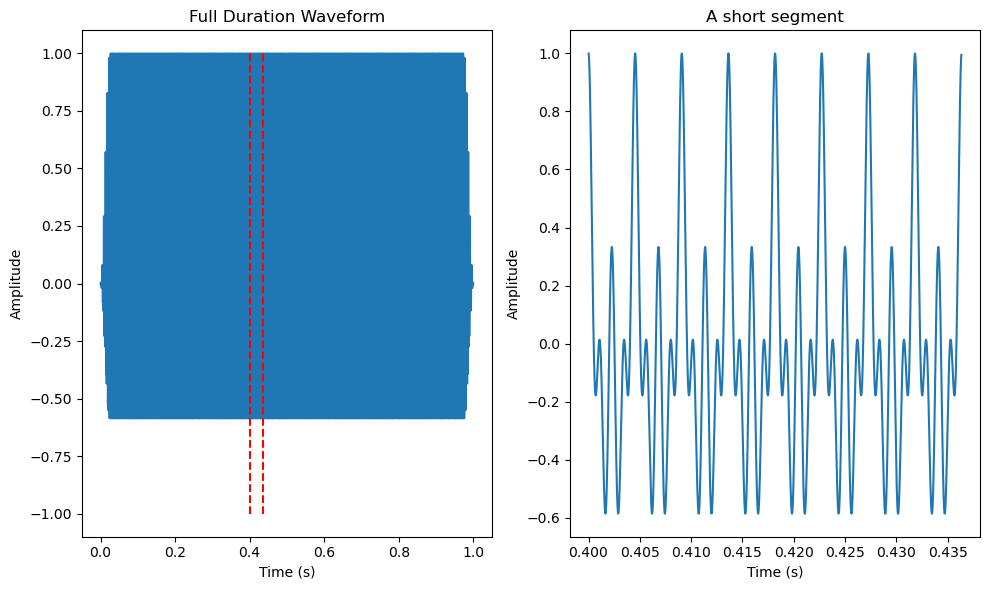

In [2]:
reload(bip)

freqs = [220,440,880]
dur = 1.0  # seconds
envs = np.ones((len(freqs), int(44100*dur)))
b = bip.beep()
b.make_bip(dur, freqs, envs) # returns normalized waveform
wf = b.wf 
# taper the waveform: 
wf = bip.taper_waveform(wf, alpha=0.05)

print(type(wf))
print(np.shape(wf))
#wf_tprd = b.taper_waveform(wf)
#plt.plot(b.t_vec, wf, color='tab:blue')
# or
#plt.plot(b.t_vec, wf, c='tab:blue')
#plt.plot(b.t_vec, wf_tprd,col='tab:red')

# MAKE THIS A TWO PANEL FIG SHOWING A FEW OSCILLATIONS... IN A PLACE OF YOUR CHOOSING..
# AND ALSO SHOW THE FULL DURATION WAVEFORM IN ANOTHER PANEL:

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 6))

# Plot a few oscillations
start = 0+int(0.4*len(b.t_vec))
end = start + int(8*(1/freqs[0])*44100)  # First 4 cycles (samples)
t_short = b.t_vec[start:end]  # First 100 samples
wf_short = wf[start:end]

bip.plot_waveforms(ax1, ax2, t_short, wf_short, b.t_vec, wf)
plt.tight_layout()
plt.show()

In [3]:
# convert to audio and play (add function in bips.py to save waveform as .wav file?)
ipd.Audio(wf, rate=44100) 

### 1. MAKE THE BASS BEAT

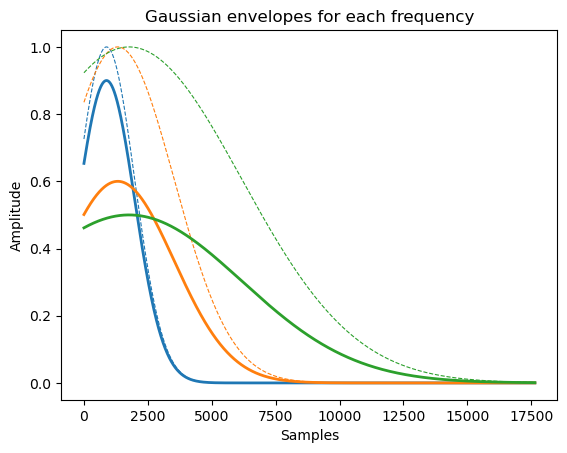

In [4]:
reload(bip)

#freqs = [220,880]
# descending frequencies
freqs = [220, 110, 55]
#freqs = [880,1760]
dur = 0.4  # seconds


# envelopes: 
# length: number of points in each window.
# std: standard deviation.
# means: list or array of mean positions to slide the Gaussian.
# Returns a 2D array: each row is a Gaussian centered at a different mean.

length = int(44100*dur)
# standard deviations (in samples)
stds = [int(length/16), int(length/8),int(length/4)]
# position in time (in samples)
means = np.linspace(0.05*length, 0.1*length, len(freqs))
# use the function in bip: 
gaussmat = bip.sliding_gaussian(length, stds, means)
weights = np.transpose([0.9, 0.6, 0.5])
# use matrix multiplication to apply per-row weights
gaussmat_w = np.diag(weights) @ gaussmat

cols = ['tab:blue','tab:orange','tab:green']
for i in range(len(freqs)):
    plt.plot(gaussmat[i,:], linestyle='--', linewidth=0.8, color=cols[i])
    plt.plot(gaussmat_w[i,:], linewidth=2.0, color=cols[i])
plt.title('Gaussian envelopes for each frequency')
plt.xlabel('Samples')
plt.ylabel('Amplitude')
plt.show()


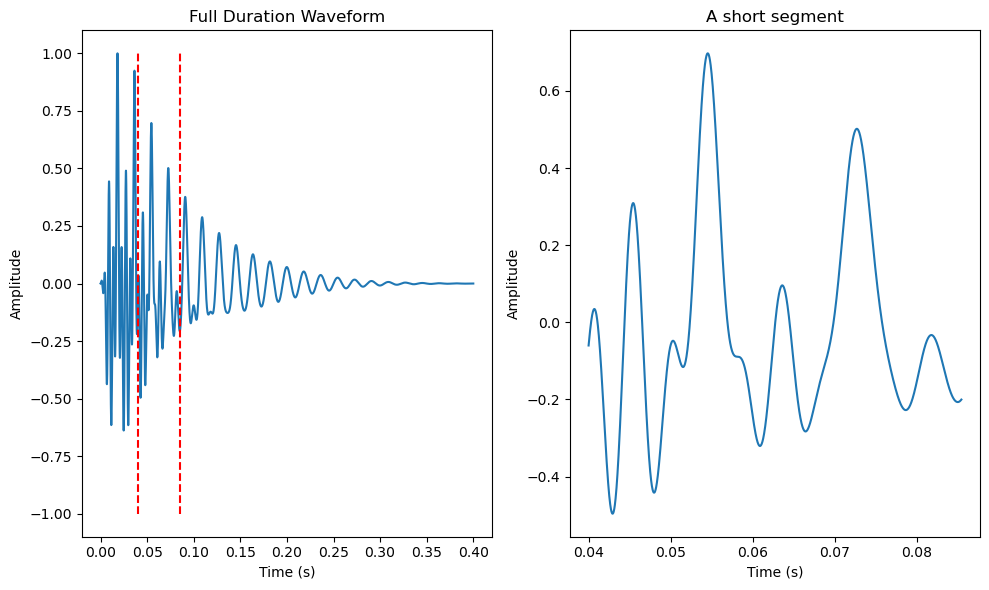

In [5]:
b = bip.beep()
b.make_bip(dur, freqs, gaussmat_w)
wf = b.wf/(np.max(np.abs(b.wf))) # normalize
# taper the waveform: 
wf = bip.taper_waveform(wf, alpha=0.05)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 6))

# Plot a few oscillations first, then the whole waveform
start = int(0.1*length)
end = start + int(10*(1/freqs[0])*44100)  # First 4 cycles (samples)
t_short = b.t_vec[start:end]  # First 100 samples
wf_short = wf[start:end]

# call the function with the existing variables
bip.plot_waveforms(ax1, ax2, t_short, wf_short, b.t_vec, wf)
plt.tight_layout()
plt.show()

In [6]:
# confirm that the waveform is normalized when converted to audio: 

ipd.Audio(wf, rate=44100) 

### 2. Create the Click

(8, 2205)


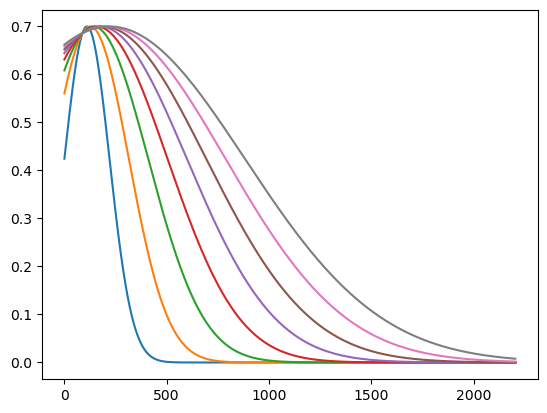

In [7]:
# now add the click: 
dur_clk = 0.05
length = int(44100*dur_clk)
freqs_clk = np.linspace(2500,5000,8)
#stds = np.ones(len(freqs_clk)) * int(length/10)
stds = np.linspace(0.05*length, 0.3*length, len(freqs_clk))
means = np.linspace(0.05*length, 0.1*length, len(freqs_clk))
gaussmat = bip.sliding_gaussian(length, stds, means)

weights = np.ones(len(freqs_clk))*0.7
gaussmat_w = np.diag(weights) @ gaussmat
print(np.shape(gaussmat_w))

#plt.plot(np.transpose(gaussmat)) 
# # why does this need to be transposed to plot correctly?
plt.plot(gaussmat_w.T)

In [8]:
b_clk = bip.beep()
b_clk.make_bip(dur_clk, freqs_clk, gaussmat_w)
clk = b_clk.wf/(np.max(np.abs(b_clk.wf))) # normalize
# taper the waveform: 
clk = bip.taper_waveform(clk, alpha=0.05)
#clk = clk[0:int(0.6*len(clk))]

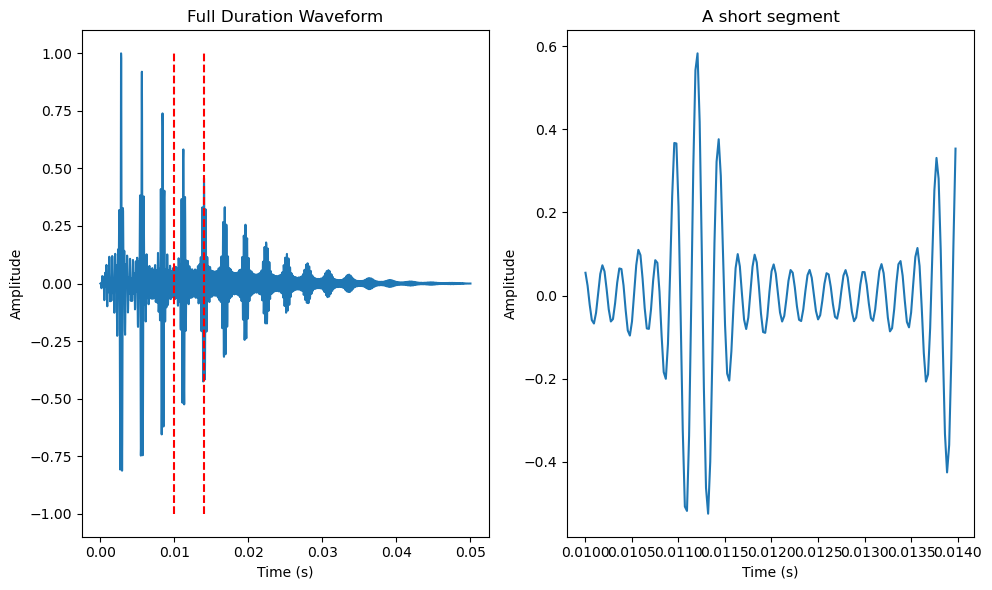

In [9]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 6))

# Plot a few oscillations first, then the whole waveform
start = int(0.2*length)
end = start + int(10*(1/freqs_clk[0])*44100)  # First 4 cycles (samples)
t_short = b_clk.t_vec[start:end]  # First 100 samples
wf_short = clk[start:end]

# call the function with the existing variables
bip.plot_waveforms(ax1, ax2, t_short, wf_short, b_clk.t_vec, clk)
plt.tight_layout()
plt.show()

In [10]:
ipd.Audio(clk, rate=44100) 

### 3. Create the soundtrack ! 
techno, level Zero ! 

In [11]:
reload(bip)

n_measures = 4 
beats_p_meas = 4
beats_p_min = 130

track_dur = n_measures * beats_p_meas / (beats_p_min) * 60  # seconds

track_time = np.linspace(0, track_dur, int(44100*track_dur))
track = np.zeros(len(track_time)) # initialize silent track

beat_dur = 1/beats_p_min * 60  # duration of one measure in seconds

print(track_dur)
print('number of samples:', int(44100*track_dur))

7.384615384615385
number of samples: 325661


In [12]:

start_times = np.linspace(0,n_measures*beats_p_meas-1,n_measures*beats_p_meas-1)*beat_dur

print(np.shape(track))
print(beat_dur)
print(start_times) 

start_inds = (start_times * 44100).astype(int)
for si in start_inds[0:]:
    track[si:si+len(wf)] = wf[:]


(325661,)
0.46153846153846156
[0.         0.49450549 0.98901099 1.48351648 1.97802198 2.47252747
 2.96703297 3.46153846 3.95604396 4.45054945 4.94505495 5.43956044
 5.93406593 6.42857143 6.92307692]


In [13]:
ipd.Audio(track, rate=44100) 

In [14]:
start_inds = ((start_times+0.5*beat_dur) * 44100).astype(int)
for si in start_inds[0:]:
    track[si:si+len(clk)] = 0.4*clk[:]

track = track/(np.max(np.abs(track)))

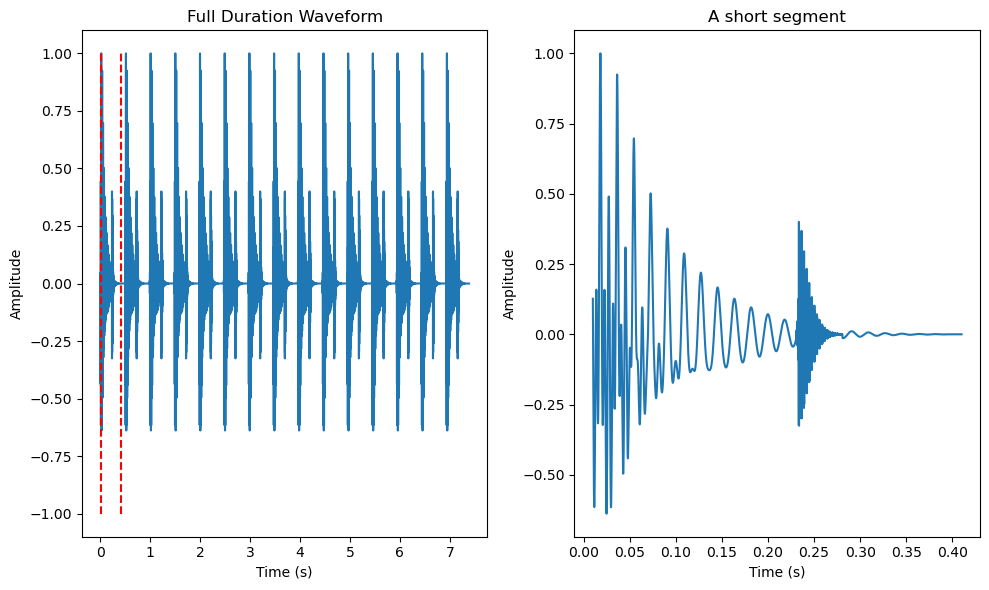

In [15]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 6))

# Plot a few oscillations first, then the whole waveform
start = int(0.2*length)
end = start + int(0.4*44100)  # First 4 cycles (samples)
t_short = track_time[start:end]  # First 100 samples
wf_short = track[start:end]

# call the function with the existing variables
bip.plot_waveforms(ax1, ax2, t_short, wf_short, track_time, track)
plt.tight_layout()
plt.show()

In [16]:
ipd.Audio(track, rate=44100) 